# 🌏 Configure the environment

If you have not installed any conda envrionments (like Anaconda, Miniconda or Miniforge) on your system, you can install the `conda` package manager by following the instructions on the [github](https://github.com/conda-forge/miniforge).

Afer installing `conda`, you should ensure that `jupyterlab` and `nb_conda_kernels` are installed in the `base` envrionment. This package allows you to use conda environments in Jupyter notebooks. You can install it by running the following command:

```bash
conda install -n base jupyterlab nb_conda_kernels
```

After installing the required packages, you can create a new conda environment for stdyer by running the following command:

```bash
cd stDyer-image
conda env create -f stdyer_image.yml
```

After creating the environment, you can switch to the stdyer environment in the VSCode by clicking on the button on the top right corner of the window and selecting the `stdyer_image` environment.
![vscode-env](tutorial_vscode_env.png)

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import hydra
from hydra import compose, initialize
from pytorch_lightning import (
    Callback,
    LightningDataModule,
    LightningModule,
    Trainer,
)
hydra.core.global_hydra.GlobalHydra.instance().clear()
import os.path as osp
import numpy as np
import scanpy as sc
initialize(config_path=osp.join("./", "configs"), version_base="1.3", job_name="test")
import warnings
warnings.filterwarnings("ignore", message=".*does not have many workers*")
warnings.filterwarnings("ignore", message=".*In combination with multi-process data loading*")
warnings.filterwarnings("ignore", message=".*Stochastic Optimizer*")
warnings.filterwarnings("ignore", message=".*is more efficient*")



# 🔍 Check data

The example dataset is the mouse brain dataset from Stereo-seq technology and should be downloaded from https://ftp.cngb.org/pub/SciRAID/stomics/STDS0000058/stomics/Mouse_brain.h5ad . It consists of 20 annotated spatial domains. The dataset is required to be in '.h5ad' format and contains `spatial` in the `obsm` attribute.


In [2]:
adata = sc.read_h5ad("example_data/MOSTA/Mouse_brain.h5ad")
assert "spatial" in adata.obsm
adata.obs['annotation'].value_counts().sort_index()

CA1                                         999
Cavity                                     4483
Cortex-L2/3                                2382
Cortex_L1                                  1803
Cortex_L4                                   705
Cortex_L5                                  2296
Cortex_L6                                  1531
Cortical amygdalar area                     506
Dentate gyrus                               733
Fiber tract                                1526
Lateral-ventral cortex                     2511
Meninges                                   1638
Midbrain                                   7678
Molecular layer of dentate gyrus           1312
Posterior amygdalar nucleus                 927
Stratum lacunosum/raditum of CA1           3187
Stratum oriens of CA1                      2163
Subiculum                                   912
Substandia nigra/Ventral tegmental area     478
Thalamus                                    976
Name: annotation, dtype: int64

## Transform spatial coordinates to image pixel coordinates

In [3]:
adata_anno_sp_split = adata.obs.index.str.split("_").to_list()
axis0s = [s[0] for s in adata_anno_sp_split]
axis1s = [s[1] for s in adata_anno_sp_split]

axis0s = np.array(axis0s, dtype=np.int32)
axis1s = np.array(axis1s, dtype=np.int32)
adata.obs["axis0"] = axis0s # the 0th axis of numpy (i.e., coordinates of y)
adata.obs["axis1"] = axis1s # the 1st axis of numpy (i.e., coordinates of x)

img_coord_key = "pixel"
bin_size = 50

# Since many technologies store x in the 0th axis of numpy, we follow the convention, though it is contray to the convention of numpy whoes 0th axis is y;
adata.obsm[img_coord_key] = np.hstack((adata.obs["axis1"].values[:, None], adata.obs["axis0"].values[:, None])) * bin_size


## Load the image and verify the spatial coordinates match with the image

The preprocessed (e.g., rotated) image (https://drive.google.com/file/d/1RHD_sBbeabW0g_EP5-gxr8BgqtbKp6-G/view?usp=sharing) is provided such that the spatial coordinates match with the image. For most of datasets, the spatial coordinates may already match with image well or simply by rotating them by 90 degrees, filpping the image, or exchange x axis with y axis.


View of AnnData object with n_obs × n_vars = 38746 × 26177
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'axis0', 'axis1'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'annotation_colors'
    obsm: 'spatial', 'pixel'
    varm: 'PCs'
    layers: 'count'


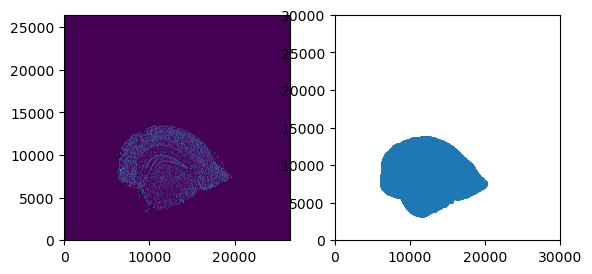

In [4]:
img_adata = sc.read_h5ad("example_data/MOSTA/Mouse_brain_spateo.h5ad")
img = img_adata.layers["stain"] * (img_adata.layers["cell_labels"] > 0)

def verify_coordinates(adata, img, coord_key, zero_axis_start, first_axis_start, zero_axis_len, first_axis_len, s=1, swap_adata_two_axis=True):
    def crop_image(img, zero_axis, first_axis, zero_axis_len, first_axis_len):
        return img[zero_axis:zero_axis+zero_axis_len, first_axis:first_axis+first_axis_len]

    img_crop = crop_image(img, zero_axis_start, first_axis_start, zero_axis_len, first_axis_len)
    # img_crop = (img_crop - img_crop.min()) / (img_crop.max() - img_crop.min())

    def crop_adata(adata, zero_axis, first_axis, zero_axis_len, first_axis_len):
        adata = adata[adata.obsm[coord_key][:, 0] >= zero_axis]
        adata = adata[adata.obsm[coord_key][:, 1] >= first_axis]
        adata = adata[adata.obsm[coord_key][:, 0] < zero_axis + zero_axis_len]
        adata = adata[adata.obsm[coord_key][:, 1] < first_axis + first_axis_len]
        return adata
    adata_crop = adata.copy()
    if swap_adata_two_axis:
        adata_crop.obsm[coord_key] = adata_crop.obsm[coord_key][:, ::-1]
    adata_crop = crop_adata(adata_crop, zero_axis_start, first_axis_start, zero_axis_len, first_axis_len)
    print(adata_crop)
    # raise
    from matplotlib import pyplot as plt
    fig, axes = plt.subplots(1, 2)
    axes[0].imshow(img_crop)
    axes[0].invert_yaxis()
    axes[1].scatter(x=adata_crop.obsm[coord_key][:, 1], y=adata_crop.obsm[coord_key][:, 0], s=s)
    axes[1].set_xlim([first_axis_start, first_axis_start + first_axis_len])
    axes[1].set_ylim([zero_axis_start, zero_axis_start + zero_axis_len])
    axes[1].set_aspect('equal')

zero_axis_start, first_axis_start, zero_axis_len, first_axis_len = 0, 0, 30000, 30000
verify_coordinates(adata, img, img_coord_key, zero_axis_start, first_axis_start, zero_axis_len, first_axis_len, s=1, swap_adata_two_axis=True)

In [5]:
adata.write_h5ad("example_data/MOSTA/Mouse_brain_pixel.h5ad", compression="gzip")

# 🔢 Specify the parameters

All configurations are stored in the `configs` directory. There are different recipes for specific senarios stored in the `configs/experiment` directory. Here we use the `configs/experiment/example.yaml` configuration file as an example. Generally, you need to specify the following parameters:

`config.datamodule.data_dir`: The path to the directory containing all datasets;

`config.datamodule.dataset_name`: The name of the directory that contains the dataset;

`config.datamodule.sample_id`: The name of the h5ad file;

`config.datamodule.num_classes`: The number of spatial domains required to be predicted;

`config.datamodule.num_hvg`: The number of used highly variable genes (3000 by default, if #gens < 3000, use all genes);

`config.datamodule.batch_size`: The batch size for training (you can decrease it if you encounter "out of memory error");

`config.model.detect_svg`: The number of spatially variable genes to be selected;

You can also modify relevant parameters in the `configs/experiment/example.yaml` configuration file to make permanent modifications.

The trainer strategy related to multi-processing is disabled temperarily in the Jupyter notebook environment to avoid issues with the multiprocessing library. 

In [2]:
config = compose(config_name="config", overrides=[f"experiment=example"])
del config.trainer.strategy
config.datamodule.data_dir = "example_data"
config.datamodule.dataset_dir = "MOSTA"
config.datamodule.sample_id = "Mouse_brain"
config.datamodule.data_file_name = "Mouse_brain_pixel.h5ad"
config.datamodule.img_file_name = "Mouse_brain_spateo.h5ad"
config.datamodule.img_coord_key = "pixel"

config.datamodule.num_classes = 20

config.datamodule.num_hvg = 3000

config.datamodule.batch_size = 1024

config.model.detect_svg = 50

# 📈 Train the model

The dataset is trained with single-threaded data loading in the jupyter notebook, which can be slow. 

In [ ]:
datamodule: LightningDataModule = hydra.utils.instantiate(config.datamodule)
model: LightningModule = hydra.utils.instantiate(config.model)
callbacks = []
if "callbacks" in config:
    for _, cb_conf in config.callbacks.items():
        if "_target_" in cb_conf:
            callbacks.append(hydra.utils.instantiate(cb_conf))
logger = False
plugins = None
trainer = hydra.utils.instantiate(config.trainer, callbacks=callbacks, logger=logger, plugins=plugins, enable_model_summary=False, _convert_="partial")
trainer.fit(model=model, datamodule=datamodule)

Alternatively, a faster way is to train the model by running the following command after setting the parameters in the configuration file as above:

```bash
python run.py experiment=example.yaml model.detect_svg=50 datamodule.data_dir="example_data" datamodule.dataset_dir="MOSTA" datamodule.sample_id="Mouse_brain" datamodule.data_file_name="Mouse_brain_pixel.h5ad" datamodule.img_file_name="Mouse_brain_spateo.h5ad"
```

# 🔬 Visualize the results

The output is saved to `logs/logger_logs` by default. We can load the saved h5ad file and visualize the results using the `scanpy` package.

In [2]:
adata = sc.read_h5ad("logs/logger_logs/epoch_199.h5ad")
adata

AnnData object with n_obs × n_vars = 38736 × 3000
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'axis0', 'axis1', 'annotation_int', 'is_labelled', 'n_counts', 'pred_labels'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'svg_dict'
    obsm: 'X_pca', 'consist_adj', 'exp_dist', 'exp_dist_origin', 'exp_k', 'exp_k_origin', 'img_dist', 'img_embed', 'img_k', 'last_used_k', 'pixel', 'prob_cat', 'sp_dist', 'sp_dist_origin', 'sp_k', 'sp_k_origin', 'spatial', 'used_k'
    varm: 'PCs'
    layers: 'count', 'scaled', 'unscaled'

Visualize the predicted clusters.

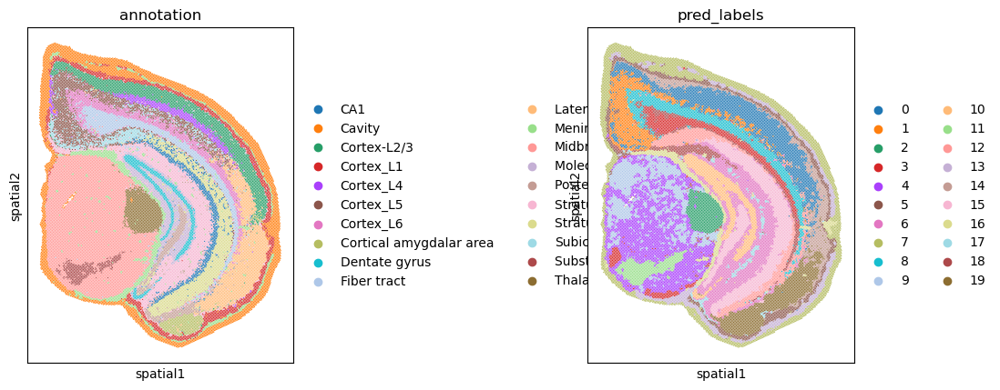

In [3]:
sc.pl.spatial(adata, color=["annotation", "pred_labels"], spot_size=1)

The identified spatially variable genes are stored in `adata.uns["svg_dict"]` as a dictionary. The keys are the predicted clusters, and the values are the specified number (50 by defaults) of spatially variable genes.

In [4]:
adata.uns["svg_dict"]

{'0': array(['Gm42418', 'Malat1', 'Ptprd', 'AC124561.1', 'Gm28928', 'Nrg1',
        'Kcnq5', 'Rorb', 'Tenm2', 'Kcnip4', 'Asap1', 'Cnksr2', 'Il1rapl1',
        'Pcdh9', 'Cntnap2', 'Meg3', 'Pcsk2', 'Grin2a', 'Lrrc4c',
        'Tmem132d', 'Tanc2', 'Hs6st3', 'Nbea', 'Hpca', 'Nrxn3', 'Cadm2',
        'Rgs7', 'Celf2', 'Gpr158', 'Kalrn', 'Cntn5', 'Fgf14', 'Kcnb2',
        'Efna5', 'Plcb1', 'Cntn3', 'Nrg3', 'Kcnd2', 'Tenm4', 'Lingo2',
        'Lrfn5', 'Kcnh7', 'Luzp2', 'R3hdm1', 'Ncdn', 'Lrrtm4', 'Ctnna2',
        'Kcnma1', 'Csmd1', 'Sgcz'], dtype=object),
 '1': array(['Gm42418', 'Tshz2', 'Nrep', 'Dkk3', 'Mbp', 'Syt1', 'Slc24a2',
        'Calm2', 'Pvalb', 'Nrgn', 'Plp1', 'Etv1', 'Mobp', 'Hcn1', 'Tcf4',
        'Prkcb', 'Il31ra', 'Rora', 'Prph', 'Gad1', 'Sst', 'Cacnb4',
        'Atp2b1', 'Atp1a2', 'Malat1', 'Rgs4', 'Mal', 'Kalrn', 'Ntm',
        'Khdrbs3', 'Mef2c', 'Anks1b', 'Cadm2', 'Pde1a', 'Ppp3ca', 'Tox',
        'Syne1', 'Gabrg3', 'Nrxn1', 'Cbln1', 'Npsr1', 'Zfpm2', 'Pcdh15',
        'Grm8

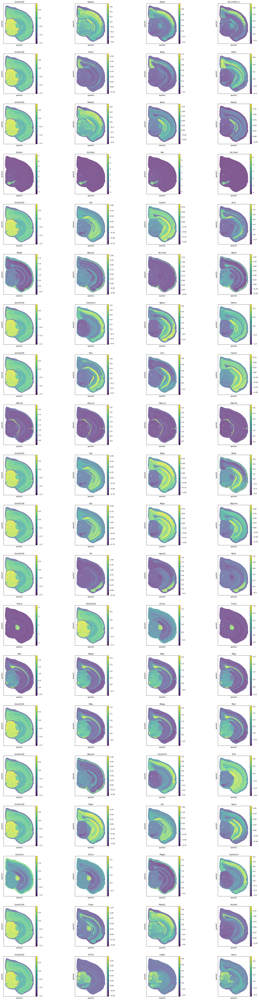

In [5]:
svgs = np.array([v[:4] for v in adata.uns["svg_dict"].values()]).flatten()
sc.pl.spatial(adata, color=svgs, spot_size=1)